<a href="https://colab.research.google.com/github/dolly1712/netflix-tvshows-movie-clustering-project/blob/main/Netflix_TV_shows_%26_movie_clustering.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Problem Statement**

The goal of this project is to cluster Netflix shows based on their attributes to enhance user experience. By effectively grouping shows into clusters, Netflix aims to offer personalized show suggestions to users, aligning with their preferences. This classification enables the identification of similarities and differences among shows, ensuring that those within a cluster share common traits while being distinct from shows in other clusters.

**Attribute Information**

1.**show_id**: Unique identifier assigned to each movie or TV show on Netflix.

2.**type**: Indicates whether the entry is a movie or a TV show.

3.**title**: Name of the movie or TV show.

4.**director**: The individual responsible for directing the movie.

5.**cast**: List of actors and actresses involved in the movie or TV show.

6.**country**: Country where the movie or TV show was produced.

7.**date_added**: Date when the movie or TV show was added to Netflix

8.**release_year**: The year when the movie or TV show was originally released.

9.**rating**: The rating assigned to the movie or TV show (e.g., PG, PG-13, TV-MA).

10.**duration**: Total duration of the movie in minutes or number of seasons for TV shows.

11.**listed_in**: Genre or category to which the movie or TV show belongs.

12.**description**: A brief summary or synopsis of the movie or TV show's plot.

**Import Libraries**

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime as dt
import missingno as msno

import warnings
warnings.filterwarnings('ignore')

from wordcloud import WordCloud, STOPWORDS
import re, string, unicodedata
import nltk
#import inflect
from bs4 import BeautifulSoup
from nltk import word_tokenize, sent_tokenize
from nltk.corpus import stopwords
from nltk.stem import LancasterStemmer, WordNetLemmatizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA

from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
import string
string.punctuation
nltk.download('omw-1.4')
from nltk.tokenize import TweetTokenizer

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as shc

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package omw-1.4 to /root/nltk_data...


**Load the dataset**

In [ ]:
original_df = pd.read_csv('/content/NETFLIX MOVIES AND TV SHOWS CLUSTERING.csv')
df = original_df.copy()

In [ ]:
# top 5 rows
df.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
0,s1,TV Show,3%,NaN,"João Miguel, Bianca Comparato, Michel Gomes, R...",Brazil,"August 14, 2020",2020,TV-MA,4 Seasons,"International TV Shows, TV Dramas, TV Sci-Fi &...",In a future where the elite inhabit an island ...
1,s2,Movie,7:19,Jorge Michel Grau,"Demián Bichir, Héctor Bonilla, Oscar Serrano, ...",Mexico,"December 23, 2016",2016,TV-MA,93 min,"Dramas, International Movies",After a devastating earthquake hits Mexico Cit...
2,s3,Movie,23:59,Gilbert Chan,"Tedd Chan, Stella Chung, Henley Hii, Lawrence ...",Singapore,"December 20, 2018",2011,R,78 min,"Horror Movies, International Movies","When an army recruit is found dead, his fellow..."
3,s4,Movie,9,Shane Acker,"Elijah Wood, John C. Reilly, Jennifer Connelly...",United States,"November 16, 2017",2009,PG-13,80 min,"Action & Adventure, Independent Movies, Sci-Fi...","In a postapocalyptic world, rag-doll robots hi..."
4,s5,Movie,21,Robert Luketic,"Jim Sturgess, Kevin Spacey, Kate Bosworth, Aar...",United States,"January 1, 2020",2008,PG-13,123 min,Dramas,A brilliant group of students become card-coun...


In [ ]:
df.tail()

,show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
7782,s7783,Movie,Zozo,Josef Fares,"Imad Creidi, Antoinette Turk, Elias Gergi, Car...","Sweden, Czech Republic, United Kingdom, Denmar...","October 19, 2020",2005,TV-MA,99 min,"Dramas, International Movies",When Lebanon's Civil War deprives Zozo of his ...
7783,s7784,Movie,Zubaan,Mozez Singh,"Vicky Kaushal, Sarah-Jane Dias, Raaghav Chanan...",India,"March 2, 2019",2015,TV-14,111 min,"Dramas, International Movies, Music & Musicals",A scrappy but poor boy worms his way into a ty...
7784,s7785,Movie,Zulu Man in Japan,NaN,Nasty C,NaN,"September 25, 2020",2019,TV-MA,44 min,"Documentaries, International Movies, Music & M...","In this documentary, South African rapper Nast..."
7785,s7786,TV Show,Zumbo's Just Desserts,NaN,"Adriano Zumbo, Rachel Khoo",Australia,"October 31, 2020",2019,TV-PG,1 Season,"International TV Shows, Reality TV",Dessert wizard Adriano Zumbo looks for the nex...
7786,s7787,Movie,ZZ TOP: THAT LITTLE OL' BAND FROM TEXAS,Sam Dunn,NaN,"United Kingdom, Canada, United States","March 1, 2020",2019,TV-MA,90 min,"Documentaries, Music & Musicals",This documentary delves into the mystique behi...


In [ ]:
df.shape

(7787, 12)

In [ ]:
# unique values in each column
df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7777 entries, 0 to 7786
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   show_id       7777 non-null   object
 1   type          7777 non-null   object
 2   title         7777 non-null   object
 3   director      7777 non-null   object
 4   cast          7777 non-null   object
 5   country       7777 non-null   object
 6   date_added    7777 non-null   object
 7   release_year  7777 non-null   int64 
 8   rating        7777 non-null   object
 9   duration      7777 non-null   object
 10  listed_in     7777 non-null   object
 11  description   7777 non-null   object
dtypes: int64(1), object(11)
memory usage: 789.9+ KB


In [ ]:
df.duplicated().sum()

0

In [ ]:
# Missing values in the dataset
msng_vlues_count = df.isna().sum()

<Axes: >

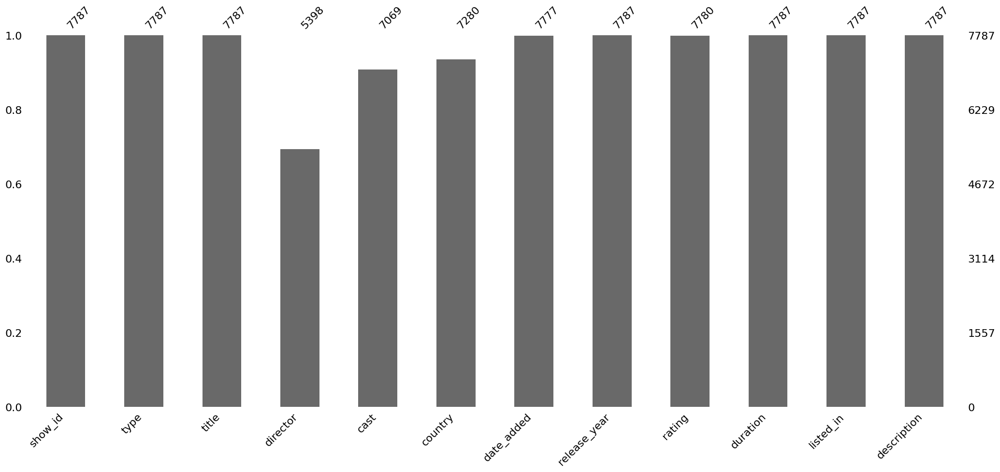

In [ ]:
msno.bar(df)


In [ ]:
# Checking the unique values in each attribute of the dataset
df.nunique()

show_id         7787
type               2
title           7787
director        4049
cast            6831
country          681
date_added      1565
release_year      73
rating            14
duration         216
listed_in        492
description     7769
dtype: int64



*   The dataset contains 7787 records and 11 attributes.
*   There are no duplicated records in the dataset

*   There are many missing values in director, cast, country, date_added, and rating columns








*   We will fill missing values of director, cast, country with 'unknown'.

*   We will fill missing values of date_added, and rating columns with mode.





In [ ]:
# Handling the missing values
df[['director','cast','country']] = df[['director','cast','country']].fillna('Unknown')
df['rating'] = df['rating'].fillna(df['rating','date_added'].mode()[0])
df.dropna(axis=0, inplace = True)

**Distribution of Categorical Variables:**

In [ ]:
type_counts = df['type'].value_counts()
rating_counts = df['rating'].value_counts()
country_counts = df['country'].value_counts()
genre_counts = df['listed_in'].value_counts()

print(type_counts)
print(rating_counts)
print(country_counts)
print(genre_counts)

Movie      5377
TV Show    2400
Name: type, dtype: int64
TV-MA       2868
TV-14       1928
TV-PG        804
R            665
PG-13        386
TV-Y         279
TV-Y7        270
PG           247
TV-G         194
NR            83
G             39
TV-Y7-FV       6
UR             5
NC-17          3
Name: rating, dtype: int64
United States                                                   2549
India                                                            923
Unknown                                                          506
United Kingdom                                                   396
Japan                                                            225
                                                                ... 
Russia, United States, China                                       1
Italy, Switzerland, France, Germany                                1
United States, United Kingdom, Canada                              1
United States, United Kingdom, Japan                     



*   To make our analysis simpler, we'll focus on just one country where each movie or TV show was primarily filmed
*   Additionally, we'll consider only the main genre associated with each movie or TV show



In [ ]:
# Splitting the primary country and primary genre to simplify the analysis
df['country'] = df['country'].apply(lambda x: x.split(',')[0])
df['listed_in'] = df['listed_in'].apply(lambda x: x.split(',')[0])

In [ ]:
# Splitting the duration column, and changing the datatype to integer
df['duration'] = df['duration'].apply(lambda x: int(x.split()[0]))

In [ ]:
# Number of seasons for tv shows
df[df['type']=='TV Show'].duration.value_counts()

1     1608
2      378
3      183
4       86
5       57
6       30
7       19
8       18
9        8
10       5
11       2
12       2
15       2
13       1
16       1
Name: duration, dtype: int64

In [ ]:
# Movie length in minutes
df[df['type']=='Movie'].duration.unique()

array([ 93,  78,  80, 123,  95, 119, 118, 143, 103,  89,  91, 149, 144,
       124,  87, 110, 128, 117, 100,  84,  99,  90, 102, 104, 105,  56,
       125,  81,  97, 106, 107, 109,  44,  75, 101,  37, 113, 114, 130,
        94, 140, 135,  82,  70, 121,  92, 164,  53,  83, 116,  86, 120,
        96, 126, 129,  77, 137, 148,  28, 122, 176,  85,  22,  68, 111,
        29, 142, 168,  21,  59,  20,  98, 108,  76,  26, 156,  30,  57,
       150, 133, 115, 154, 127, 146, 136,  88, 131,  24, 112,  74,  63,
        38,  25, 174,  60, 153, 158, 151, 162,  54,  51,  69,  64, 147,
        42,  79,  40,  45, 172,  10, 163,  55,  72,  61,  71, 160, 171,
        48, 139, 157,  15,  65, 134, 161,  62, 186,  49,  73,  58, 165,
       166, 138, 159, 141, 132,  52,  67,  34,  66, 312, 180,  47, 155,
        14, 177,  11,   9,  46, 145,   8,  12,  43,  50,  23, 185, 200,
       169,  27, 170, 196,  33, 181, 204,  32,  35, 167, 179, 193,  13,
       214,  17, 173, 192, 209, 187,  41, 182, 224, 233, 189, 15

**Changing dtype of 'date_added' from string to datetime**

In [ ]:
# Typecasting 'date_added' from string to datetime
df["date_added"] = pd.to_datetime(df['date_added'])

**Creating new featueres**

In [ ]:
# Adding new attributes month and year of date added
df['month_added'] = df['date_added'].dt.month
df['year_added'] = df['date_added'].dt.year
df.drop('date_added', axis=1, inplace=True)

**Exploratory Data Analysis**

**Univatiate Analysis**

**Number of Movies and TV Shows in the dataset**

Text(0.5, 1.0, 'Movies and TV Shows in the dataset')

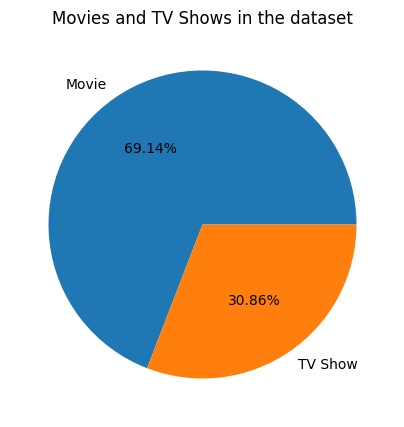

In [ ]:
# Number of Movies and TV Shows in the dataset
plt.figure(figsize=(5,5))
df.type.value_counts().plot(kind='pie',autopct='%1.2f%%')
plt.ylabel('')
plt.title('Movies and TV Shows in the dataset')



*   The dataset contains a higher proportion of movies (69.14%) compared to TV shows (30.86%).




In [ ]:
# Group by director and count the number of TV shows and movies directed by each director
director_counts = df.groupby(['director', 'type']).size().reset_index(name='count')

# Identify top directors based on the number of TV shows and movies directed
top_directors = director_counts.groupby('director')['count'].sum().nlargest(10).index.tolist()
print("Top Directors:", top_directors)

Top Directors: ['Unknown', 'Raúl Campos, Jan Suter', 'Marcus Raboy', 'Jay Karas', 'Cathy Garcia-Molina', 'Jay Chapman', 'Martin Scorsese', 'Youssef Chahine', 'Steven Spielberg', 'David Dhawan']


Text(0.5, 1.0, 'Top 10 directors by number of shows directed')

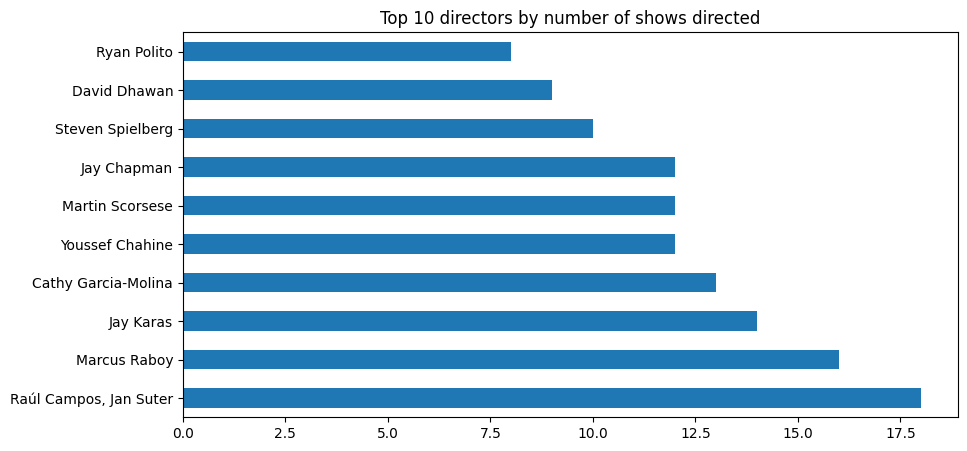

In [ ]:
# Top 10 directors in the dataset
plt.figure(figsize=(10,5))
df[~(df['director']=='Unknown')].director.value_counts().nlargest(10).plot(kind='barh')
plt.title('Top 10 directors by number of shows directed')

*   Raul Campos and Jan Suter together have directed 18 movies / TV shows, higher than anyone in the dataset.


Text(0.5, 1.0, ' Top 10 countries with the highest number of shows')

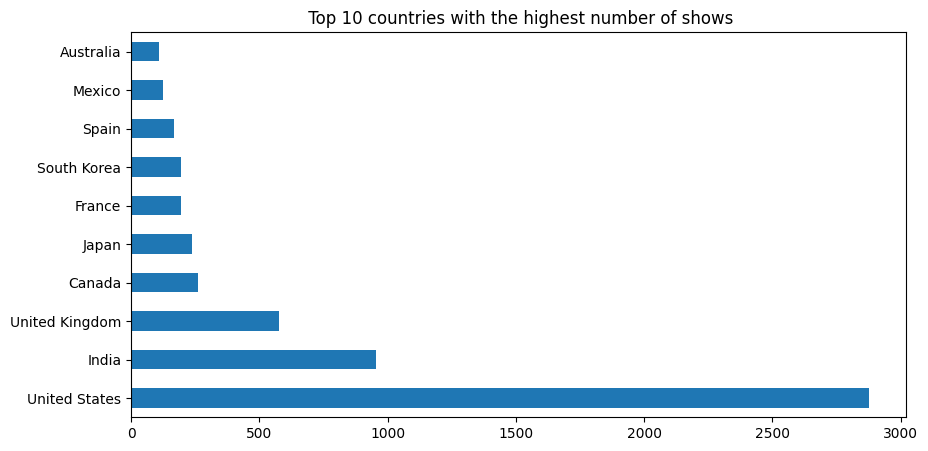

In [ ]:
# Top 10 countries with the highest number movies / TV shows in the dataset
plt.figure(figsize=(10,5))
df[~(df['country']=='Unknown')].country.value_counts().nlargest(10).plot(kind='barh')
plt.title(' Top 10 countries with the highest number of shows')



*   The highest number of movies / TV shows were based out of the US, followed by India and UK




Text(0.5, 1.0, ' Top 10 countries with the highest number of shows')

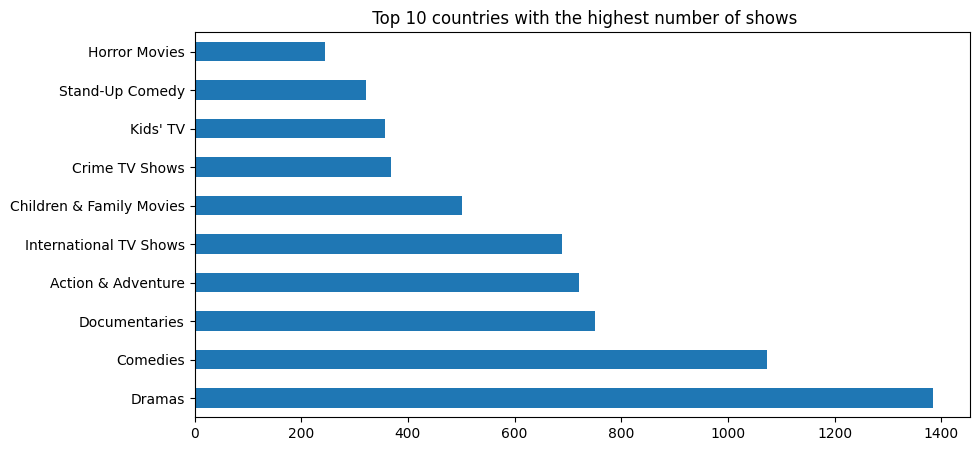

In [ ]:
# Top 10 genres with the highest number movies / TV shows in the dataset
plt.figure(figsize=(10,5))
df['listed_in'].value_counts().nlargest(10).plot(kind='barh')
plt.title(' Top 10 genres with the highest number of shows')



*   The dramas is the most popular genre followed by comedies and documentaries.




Text(0.5, 1.0, 'distribution by released year')

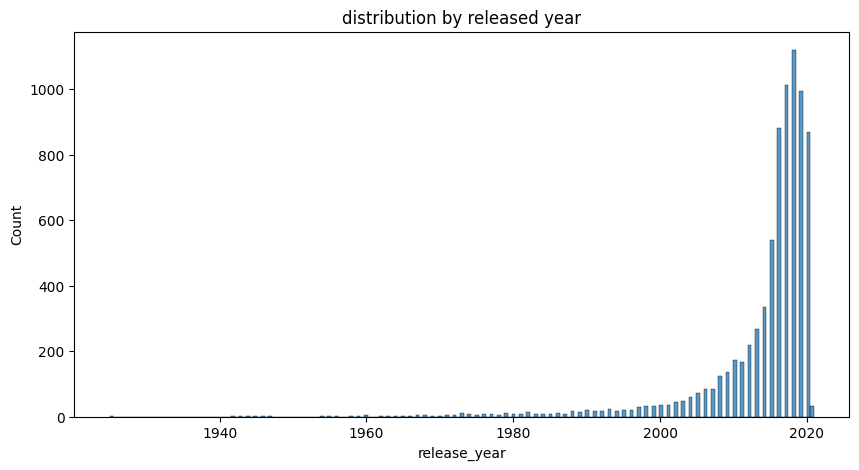

In [ ]:
# Visualizing the year in which the movie / tv show was released
plt.figure(figsize=(10,5))
sns.histplot(df['release_year'])
plt.title('distribution by released year')



*   More movies were added after 2000s and decrease in content was seen in 2020



**Bivariate Analysis**

**Time Series Analysis**

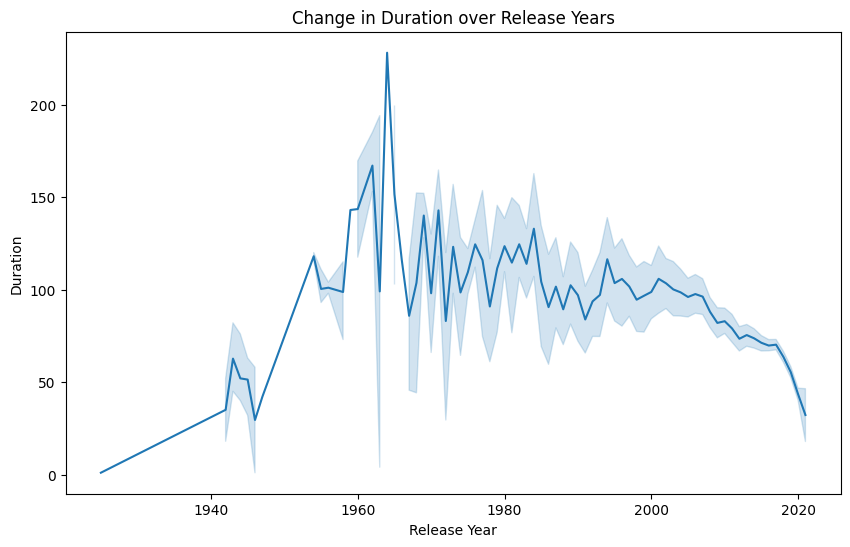

In [ ]:
plt.figure(figsize=(10, 6))
sns.lineplot(x='release_year', y='duration', data=df)
plt.title('Change in Duration over Release Years')
plt.xlabel('Release Year')
plt.ylabel('Duration')
plt.show()




*   Duration of content added on netflix has decreased after 1980
*   Average time of content is 130 minutes



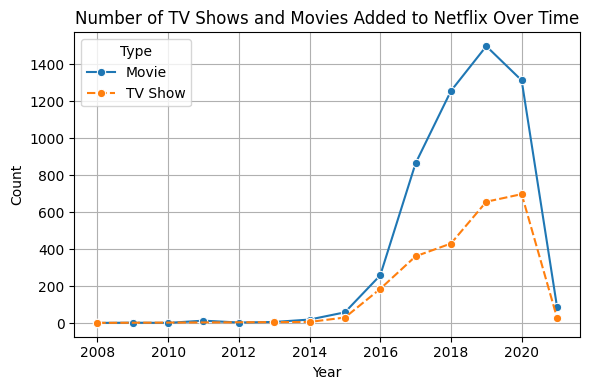

In [ ]:
# Group by 'year_added' and 'type' to count the number of TV shows and movies added each year
content_added_per_year = df.groupby(['year_added', 'type']).size().unstack()

# Plotting the trend
plt.figure(figsize=(6, 4))
sns.lineplot(data=content_added_per_year, marker='o')
plt.title('Number of TV Shows and Movies Added to Netflix Over Time')
plt.xlabel('Year')
plt.ylabel('Count')
plt.legend(title='Type', loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()



*   More movies were added from 2016 to 2020.




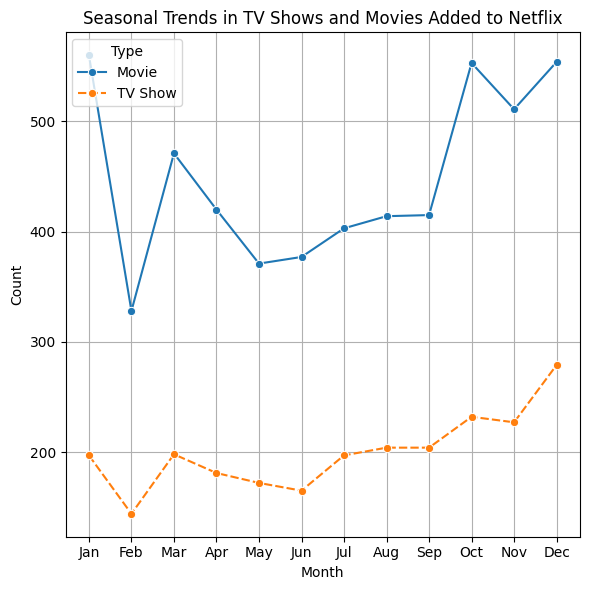

In [ ]:
# Group by 'month_added' and 'type' to count the number of TV shows and movies added each month
content_added_per_month = df.groupby(['month_added', 'type']).size().unstack()

# Plotting the trend
plt.figure(figsize=(6, 6))
sns.lineplot(data=content_added_per_month, marker='o')
plt.title('Seasonal Trends in TV Shows and Movies Added to Netflix')
plt.xlabel('Month')
plt.ylabel('Count')
plt.xticks(range(1, 13), ['Jan', 'Feb', 'Mar', 'Apr', 'May', 'Jun', 'Jul', 'Aug', 'Sep', 'Oct', 'Nov', 'Dec'])
plt.legend(title='Type', loc='upper left')
plt.grid(True)
plt.tight_layout()
plt.show()


**Content Duration:**

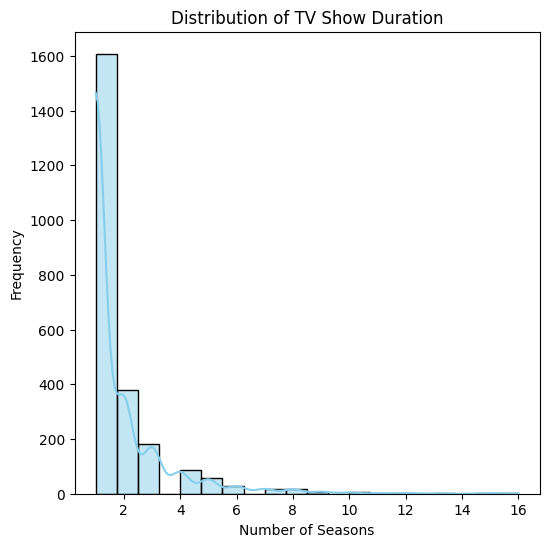

In [ ]:
# Filter TV shows and movies separately
tv_shows = df[df['type'] == 'TV Show']


# Plotting the distribution of content duration for TV shows
plt.figure(figsize=(6, 6))
sns.histplot(tv_shows['duration'], bins=20, kde=True, color='skyblue')
plt.title('Distribution of TV Show Duration')
plt.xlabel('Number of Seasons')
plt.ylabel('Frequency')
plt.show()




*   Most TV Shows on Netflix has 1-4 season



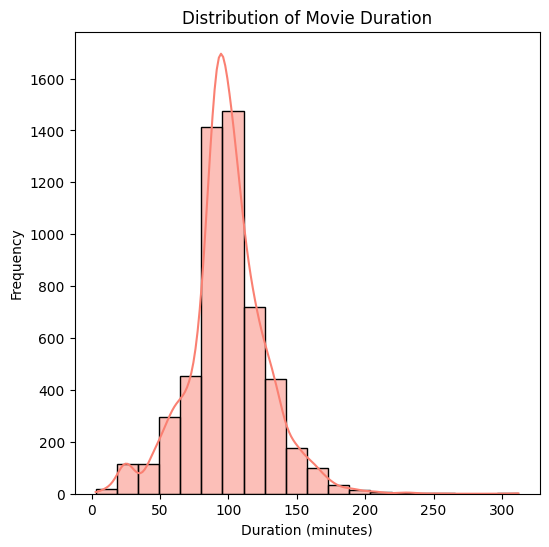

In [ ]:
movies = df[df['type'] == 'Movie']
# Plotting the distribution of content duration for movies
plt.figure(figsize=(6, 6))
sns.histplot(movies['duration'], bins=20, kde=True, color='salmon')
plt.title('Distribution of Movie Duration')
plt.xlabel('Duration (minutes)')
plt.ylabel('Frequency')
plt.show()



*   Average movie duration is 120 minutes.




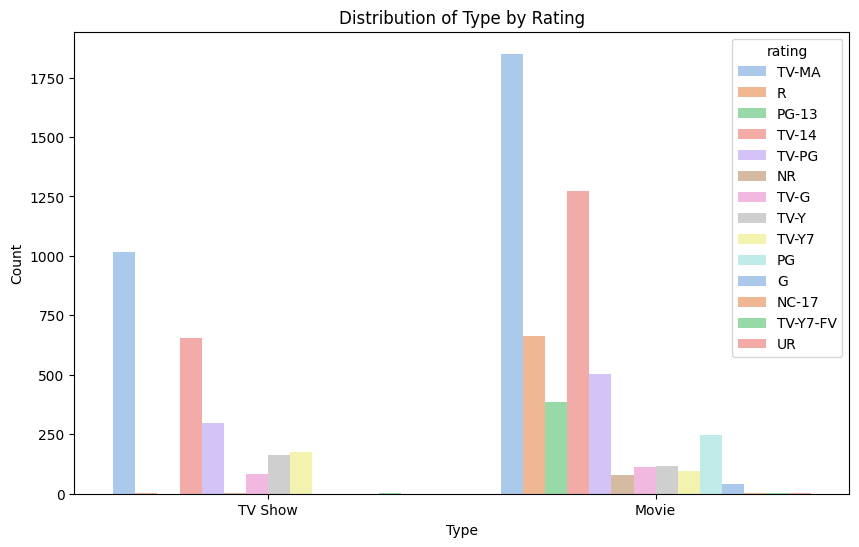

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(x='type', hue='rating', data=df, palette='pastel')
plt.title('Distribution of Type by Rating')
plt.xlabel('Type')
plt.ylabel('Count')
plt.show()




*   Most movies are TV-MA rated and least movies are rated for kids
*   Most TV Show are TV-MA rated and least TV Show  are rated for kids



In [ ]:
# Group by cast and count the number of TV shows and movies involving each actor
cast_counts = df.groupby(['cast', 'type']).size().reset_index(name='count')

# Identify top actors based on the number of TV shows and movies they were involved in
top_actors = cast_counts.groupby('cast')['count'].sum().nlargest(10).index.tolist()
print("Top Actors:", top_actors)

Top Actors: ['Unknown', 'David Attenborough', 'Samuel West', 'Jeff Dunham', 'Craig Sechler', 'Kevin Hart', 'Michela Luci, Jamie Watson, Eric Peterson, Anna Claire Bartlam, Nicolas Aqui, Cory Doran, Julie Lemieux, Derek McGrath', 'Bill Burr', 'Iliza Shlesinger', 'Jim Gaffigan']


Text(0.5, 1.0, 'Top 10 TV show directors')

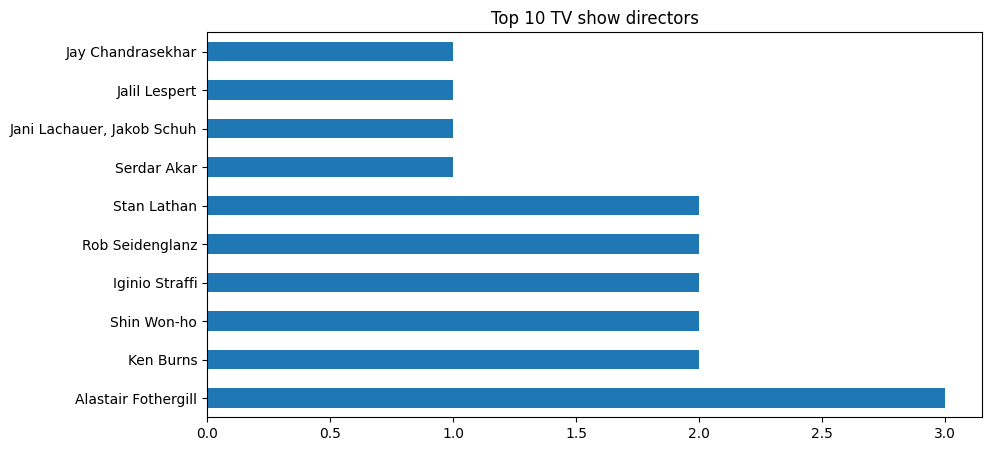

In [ ]:
# Top 10 TV show directors
plt.figure(figsize=(10,5))
df[~(df['director']=='Unknown') & (df['type']=='TV Show')].director.value_counts().nlargest(10).plot(kind='barh')
plt.title('Top 10 TV show directors')



Text(0.5, 1.0, 'Top 10 TV show directors')

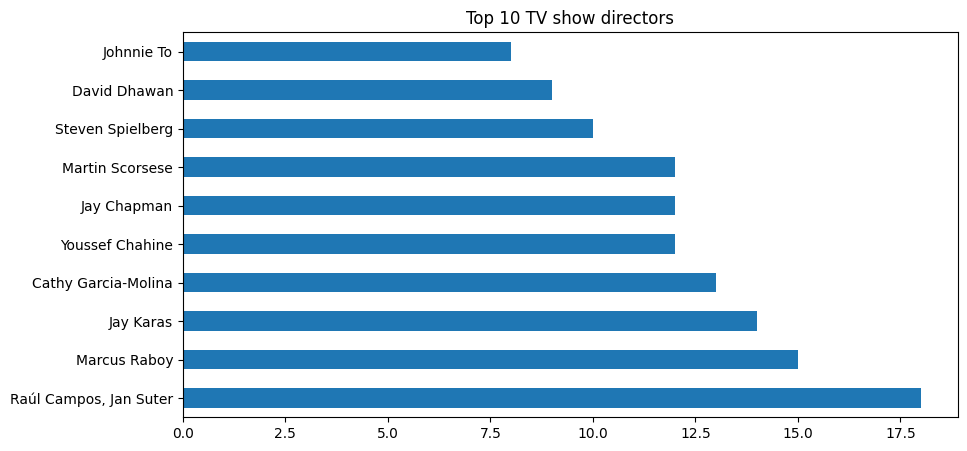

In [ ]:
# Top 10 Movie directors
plt.figure(figsize=(10,5))
df[~(df['director']=='Unknown') & (df['type']=='Movie')].director.value_counts().nlargest(10).plot(kind='barh')
plt.title('Top 10 Movie directors')

Text(0.5, 1.0, 'Actors who have appeared in highest number of movies')

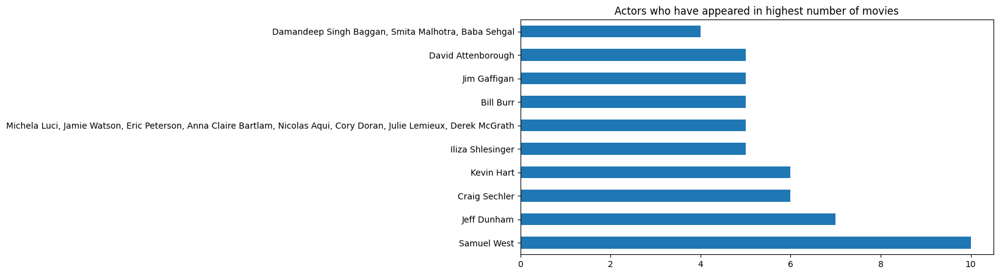

In [ ]:
# Top actors for movies
plt.figure(figsize=(10,5))
df[~(df['cast']=='Unknown') & (df['type']=='Movie')].cast.value_counts().nlargest(10).plot(kind='barh')
plt.title('Actors who have appeared in highest number of movies')



*   Samuel West has appeared in 10 movies, followed by Jeff Dunham with 7 movies.




Text(0.5, 1.0, 'Actors who have appeared in highest number of TV Show')

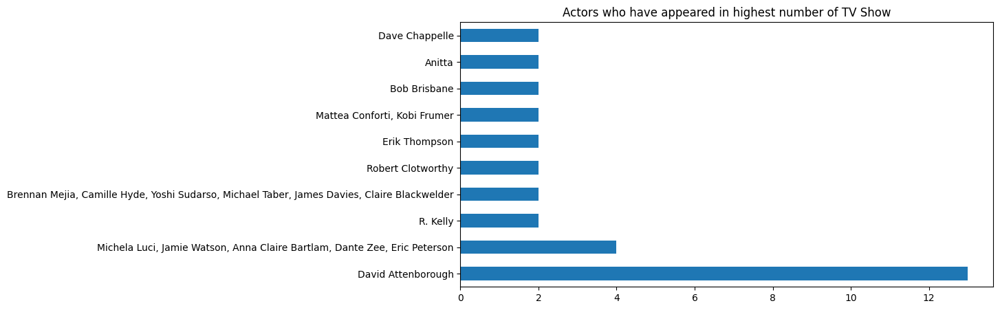

In [ ]:
# Top actors for TV Show
plt.figure(figsize=(10,5))
df[~(df['cast']=='Unknown') & (df['type']=='TV Show')].cast.value_counts().nlargest(10).plot(kind='barh')
plt.title('Actors who have appeared in highest number of TV Show')



*   David Attenborough has appeared in 13 TV shows, followed by Michela Luci, Jamie Watson, Anna Claire Bartlam, Dante Zee, Eric Peterson with 4 TV shows.




Text(0.5, 1.0, 'Top 10 genres for movies')

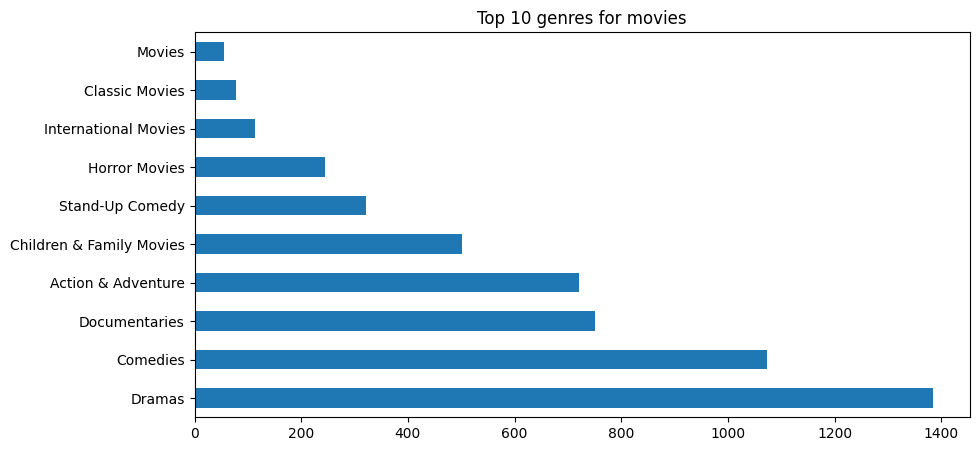

In [ ]:
# Top 10 genre for movies
plt.figure(figsize=(10,5))
df[df['type']=='Movie'].listed_in.value_counts().nlargest(10).plot(kind='barh')
plt.title('Top 10 genres for movies')



*   Dramas, comedies, and documentaries are the most popular genre for the movies on Netflix.




Text(0.5, 1.0, 'Top 10 genres for TV Shows')

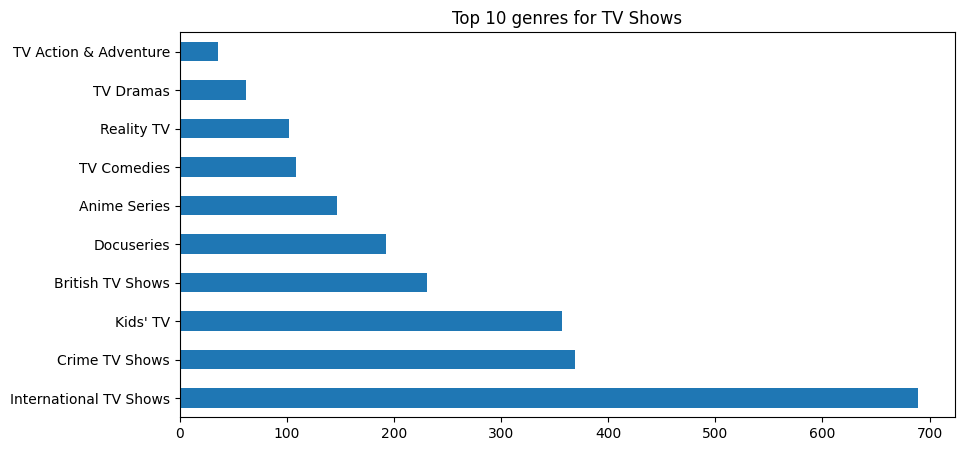

In [ ]:
# Top 10 genre for tv shows
plt.figure(figsize=(10,5))
df[df['type']=='TV Show'].listed_in.value_counts().nlargest(10).plot(kind='barh')
plt.title('Top 10 genres for TV Shows')



*   International, crime, and kids are the most popular genre for TV shows on Netflix




**Model Implementation**

We will cluster the shows on Netflix based on the following attributes:


*   Director
*   Cast
*   Country
*   Listed in
*   Description



In [ ]:
# Using the original dataset for clustering since
# it does not require handling missing values
df1 = original_df.copy()

In [ ]:
# Combining all the clustering attributes into a single column

df1['clustering_attributes'] = (df1['director'] + ' ' +
                                df1['cast'] +' ' +
                                df1['country'] +' ' +
                                df1['listed_in'] +' ' +
                                df1['description'])

In [ ]:
df1['clustering_attributes'][27]

'Cho Il Yoo Ah-in, Park Shin-hye South Korea Horror Movies, International Movies, Thrillers As a grisly virus rampages a city, a lone man stays locked inside his apartment, digitally cut off from seeking help and desperate to find a way out.'

**Removing non-ASCII characters:**

In [ ]:
# function to remove non-ascii characters

def remove_non_ascii(words):
    """Function to remove non-ASCII characters"""
    new_words = []
    for word in words:
        new_word = unicodedata.normalize('NFKD', word).encode('ascii', 'ignore').decode('utf-8', 'ignore')
        new_words.append(new_word)
    return new_words

In [ ]:
# Remove non-ascii characters
df1['clustering_attributes'] = df1['clustering_attributes'].astype(str)  # Convert to string
df1['clustering_attributes'] = remove_non_ascii(df1['clustering_attributes'])


In [ ]:
df1['clustering_attributes'][27]

'Cho Il Yoo Ah-in, Park Shin-hye South Korea Horror Movies, International Movies, Thrillers As a grisly virus rampages a city, a lone man stays locked inside his apartment, digitally cut off from seeking help and desperate to find a way out.'

 **Remove stopwords and lower case:**

In [ ]:
# extracting the stopwords from nltk library
sw = stopwords.words('english')
# displaying the stopwords
np.array(sw)

array(['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you',
       "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself',
       'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her',
       'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them',
       'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom',
       'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are',
       'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had',
       'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and',
       'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at',
       'by', 'for', 'with', 'about', 'against', 'between', 'into',
       'through', 'during', 'before', 'after', 'above', 'below', 'to',
       'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under',
       'again', 'further', 'then', 'once', 'here', 'there', 'when',
       'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'm

In [ ]:
# function to remove stop words
def stopwords(text):
    '''a function for removing the stopword'''
    # removing the stop words and lowercasing the selected words
    text = [word.lower() for word in text.split() if word.lower() not in sw]
    # joining the list of words with space separator
    return " ".join(text)

In [ ]:
# Removing stop words
df1['clustering_attributes'] = df1['clustering_attributes'].apply(stopwords)

In [ ]:
df1['clustering_attributes'][27]

'cho il yoo ah-in, park shin-hye south korea horror movies, international movies, thrillers grisly virus rampages city, lone man stays locked inside apartment, digitally cut seeking help desperate find way out.'

**Remove punctuations:**

In [ ]:
# function to remove punctuations
def remove_punctuation(text):
    '''a function for removing punctuation'''
    translator = str.maketrans('', '', string.punctuation)
    # return the text stripped of punctuation marks
    return text.translate(translator)

In [ ]:
# Removing punctuation marks
df1['clustering_attributes'] = df1['clustering_attributes'].apply(remove_punctuation)

In [ ]:
df1['clustering_attributes'][27]

'cho il yoo ahin park shinhye south korea horror movies international movies thrillers grisly virus rampages city lone man stays locked inside apartment digitally cut seeking help desperate find way out'

**Lemmatization:**

In [ ]:
# function to lemmatize the corpus
def lemmatize_verbs(words):
    """Lemmatize verbs in list of tokenized words"""
    lemmatizer = WordNetLemmatizer()
    lemmas = []
    for word in words:
        lemma = lemmatizer.lemmatize(word, pos='v')
        lemmas.append(lemma)
    return lemmas

In [ ]:
# Lemmatization
df1['clustering_attributes'] = lemmatize_verbs(df1['clustering_attributes'])

In [ ]:
df1['clustering_attributes'][27]

'cho il yoo ahin park shinhye south korea horror movies international movies thrillers grisly virus rampages city lone man stays locked inside apartment digitally cut seeking help desperate find way out'

**Tokenization:**

In [ ]:
tokenizer = TweetTokenizer()

In [ ]:
df1['clustering_attributes'] = df1['clustering_attributes'].apply(lambda x: tokenizer.tokenize(x))

**Vectorization:**

In [ ]:
# clustering tokens saved in a variable
clustering_data = df1['clustering_attributes']

In [ ]:
# Tokenization
def identity_tokenizer(text):
    return text

# Using TFIDF vectorizer to vectorize the corpus
# max features = 20000 to prevent system from crashing
tfidf = TfidfVectorizer(tokenizer=identity_tokenizer, stop_words='english', lowercase=False,max_features = 20000)
X = tfidf.fit_transform(clustering_data)

In [ ]:
X

<7787x20000 sparse matrix of type '<class 'numpy.float64'>'
	with 160381 stored elements in Compressed Sparse Row format>

In [ ]:
# Shape of X
X.shape

(7787, 20000)

In [ ]:
# data type of vector
type(X)

scipy.sparse._csr.csr_matrix

In [ ]:
# convert X into array form for clustering
X = X.toarray()

**Dimensionality reduction using PCA:**

In [ ]:
# using PCA to reduce dimensionality
pca = PCA(random_state=21)
pca.fit(X)

PCA(random_state=21)

Text(0, 0.5, 'cumulative explained variance')

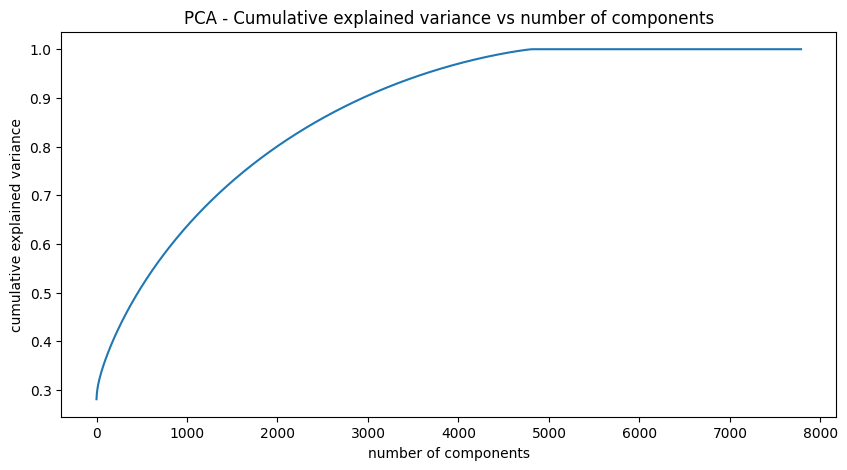

In [ ]:
# Explained variance for different number of components
plt.figure(figsize=(10,5))
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('PCA - Cumulative explained variance vs number of components')
plt.xlabel('number of components')
plt.ylabel('cumulative explained variance')



*   We find that 100% of the variance is explained by about ~7500 components.
*   Also, more than 80% of the variance is explained just by 4000 components.

*   Hence to simplify the model, and reduce dimensionality, we can take the top 4000 components, which will still be able to capture more than 80% of variance





In [ ]:
# reducing the dimensions to 4000 using pca
pca = PCA(n_components=4000,random_state=21)
pca.fit(X)

PCA(n_components=4000, random_state=21)

In [ ]:
# transformed features.
x_pca = pca.transform(X)

In [ ]:
# shape of transformed vectors
x_pca.shape

(7787, 4000)

**Clusters implementation:**

**K-Means Clustering:**

Text(0, 0.5, 'WCSS')

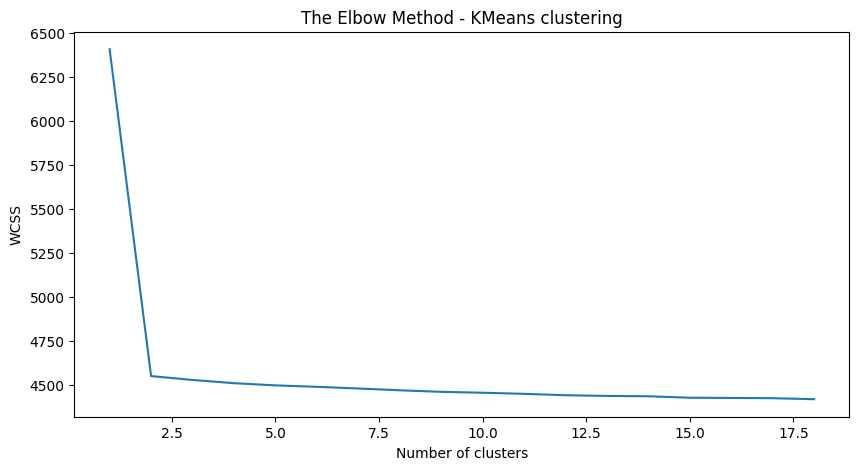

In [ ]:
# Elbow method to find the optimal value of k
wcss=[]
for i in range(1,19):
  kmeans = KMeans(n_clusters=i,init='k-means++',random_state=21)
  kmeans.fit(x_pca)
  wcss_iter = kmeans.inertia_
  wcss.append(wcss_iter)

number_clusters = range(1,19)
plt.figure(figsize=(10,5))
plt.plot(number_clusters,wcss)
plt.title('The Elbow Method - KMeans clustering')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')

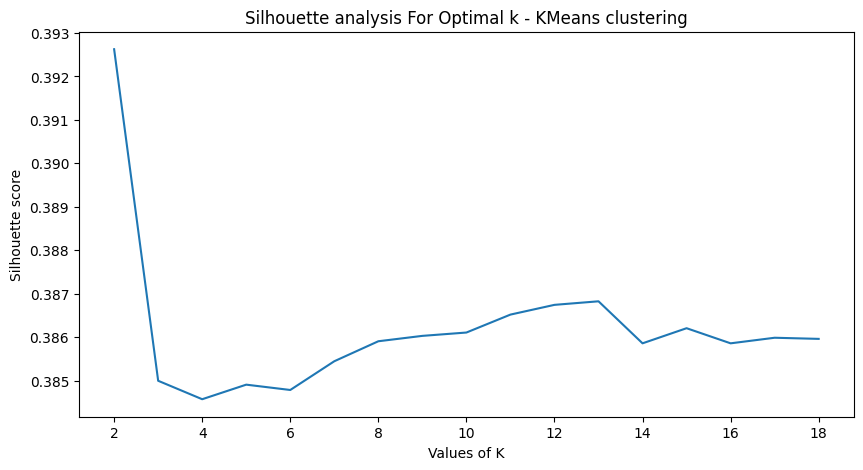

In [ ]:
 # Plotting Silhouette score for different number of clusters
range_n_clusters = range(2,19) #range(2,31)
silhouette_avg = []
for num_clusters in range_n_clusters:
  # initialize kmeans
  kmeans = KMeans(n_clusters=num_clusters,init='k-means++',random_state=21) #random_state=33
  kmeans.fit(x_pca)
  cluster_labels = kmeans.labels_

  # silhouette score
  silhouette_avg.append(silhouette_score(x_pca, cluster_labels))

plt.figure(figsize=(10,5))
plt.plot(range_n_clusters,silhouette_avg)
plt.xlabel('Values of K')
plt.ylabel('Silhouette score')
plt.title('Silhouette analysis For Optimal k - KMeans clustering')
plt.show()

In [ ]:
# Clustering the data into 13 clusters
kmeans = KMeans(n_clusters=13,init='k-means++',random_state=21) ##random_state=33
kmeans.fit(x_pca)

KMeans(n_clusters=13, random_state=21)

In [ ]:
# Evaluation metrics - distortion, Silhouette score
kmeans_distortion = kmeans.inertia_
kmeans_silhouette_score = silhouette_score(x_pca, kmeans.labels_)

print((kmeans_distortion,kmeans_silhouette_score))

(4435.268482389236, 0.3868237725978542)


In [ ]:
# Adding a kmeans cluster number attribute
df1['kmeans_cluster'] = kmeans.labels_

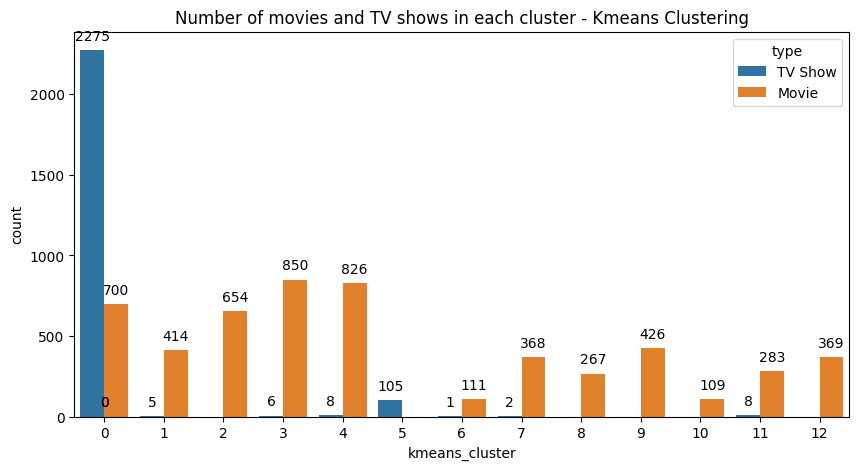

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
q = sns.countplot(x='kmeans_cluster',data=df1, hue='type')
plt.title('Number of movies and TV shows in each cluster - Kmeans Clustering')
for i in q.patches:
  q.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center',xytext = (0, 10), textcoords = 'offset points')

**Building wordclouds for different clusters built:**

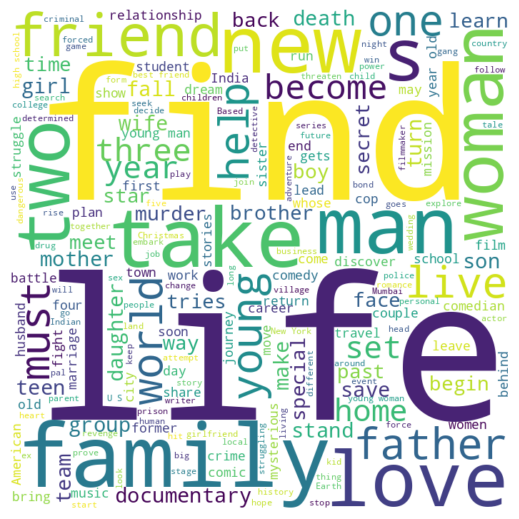

In [ ]:
# Extract movie descriptions
movie_descriptions = " ".join(df[df['type'] == 'Movie']['description'].dropna())

# Create a WordCloud object with specific parameters
wordcloud = WordCloud(width=700, height=700, background_color='white', min_font_size=10).generate(movie_descriptions)

# Plot the WordCloud image
plt.figure(figsize=(10, 5), facecolor=None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()


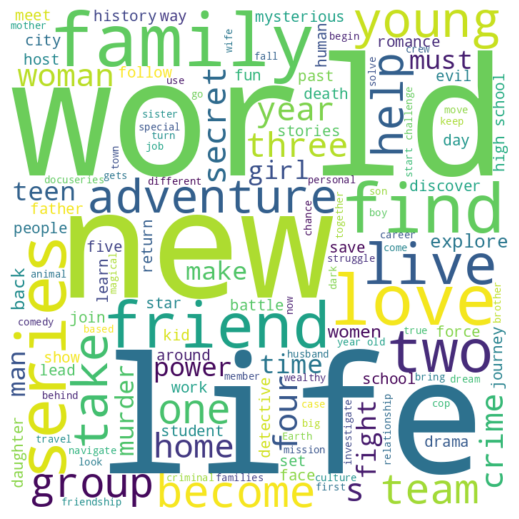

In [ ]:
# Extract TV Show descriptions
movie_descriptions = " ".join(df[df['type'] == 'TV Show']['description'].dropna())

# Create a WordCloud object with specific parameters
wordcloud = WordCloud(width=700, height=700, background_color='white', min_font_size=10).generate(movie_descriptions)

# Plot the WordCloud image
plt.figure(figsize=(10, 5), facecolor=None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
plt.show()


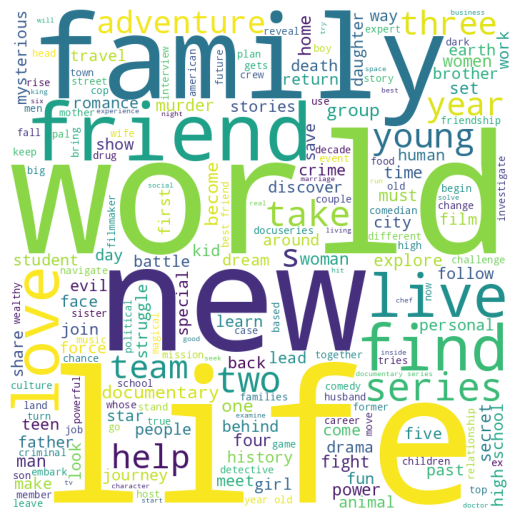

In [ ]:
# Wordcloud for cluster 0
kmeans_worldcloud(0)



*   Keywords observed in cluster 0: life, new, family, friend, save, help, discover, home, teen




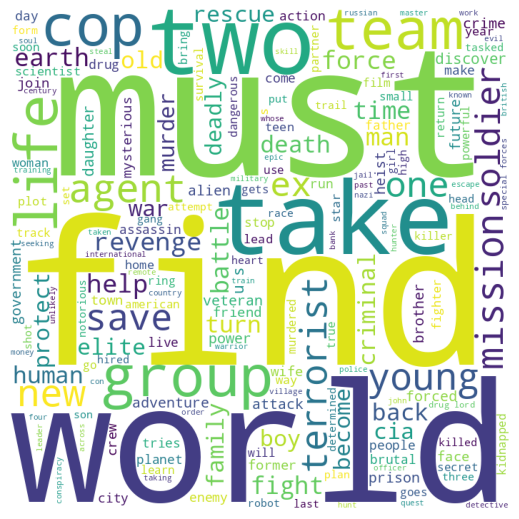

In [ ]:
# Wordcloud for cluster 1
kmeans_wordcloud(1)



*   Keywords observed in cluster 1: life, love, family, father, young, girl, man, woman, friend, daughter




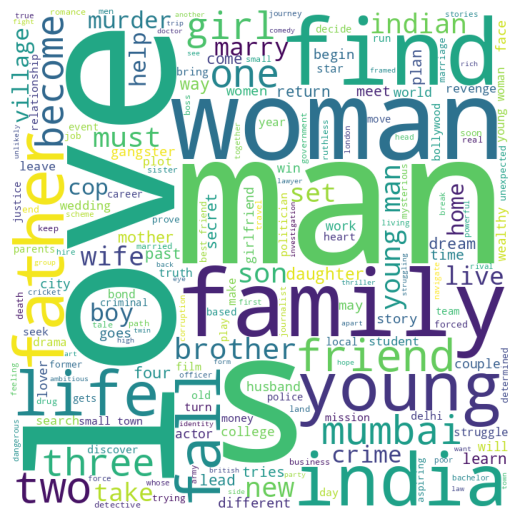

In [ ]:
# Wordcloud for cluster 2
kmeans_worldcloud(2)



*   Keywords observed in cluster 2: young, world, girl, mysterious, humanity, life, student, school, battle, demon, force




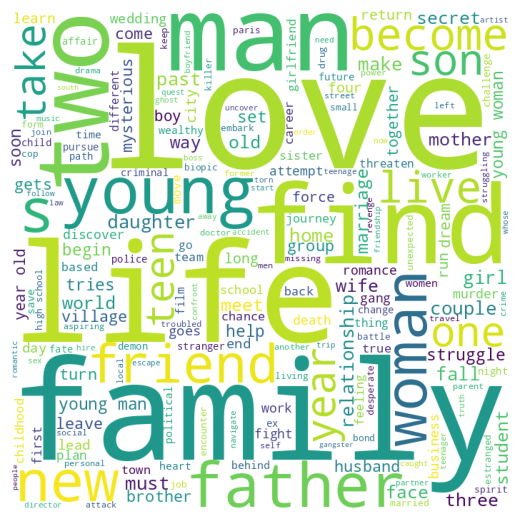

In [ ]:
# Wordcloud for cluster 3
kmeans_Wordcloud(3)



*   Keywords observed in cluster 3: love, life, family, romance, crime, murder, world, adventure




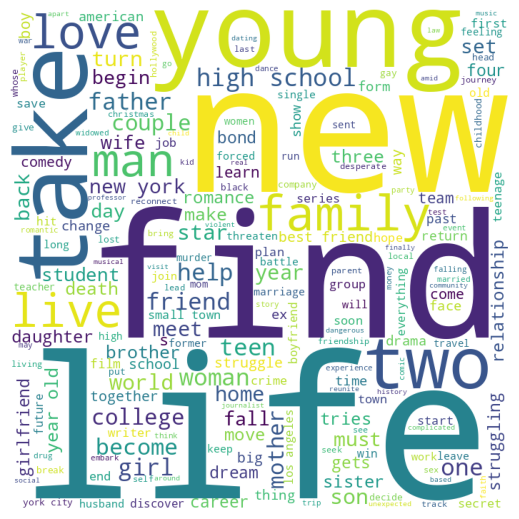

In [ ]:
# Wordcloud for cluster 4
kmeans_wordcloud(4)



*   Keywords observed in cluster 4: comedian, special, stand, comic, stage, sex, joke




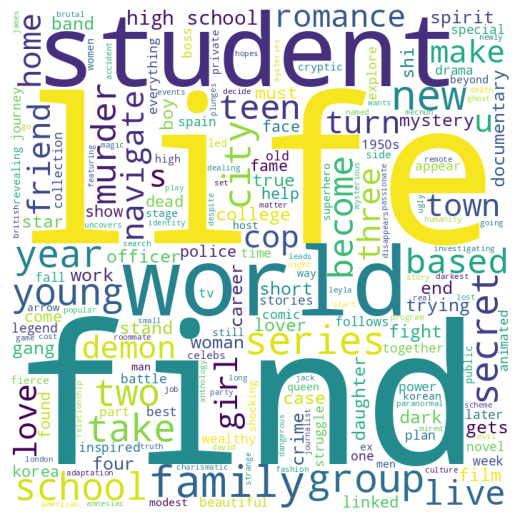

In [ ]:
# Wordcloud for cluster 5
kmeans_wordcloud(5)



*   Keywords observed in cluster 5: documentary, world, life, filmmaker, american, life




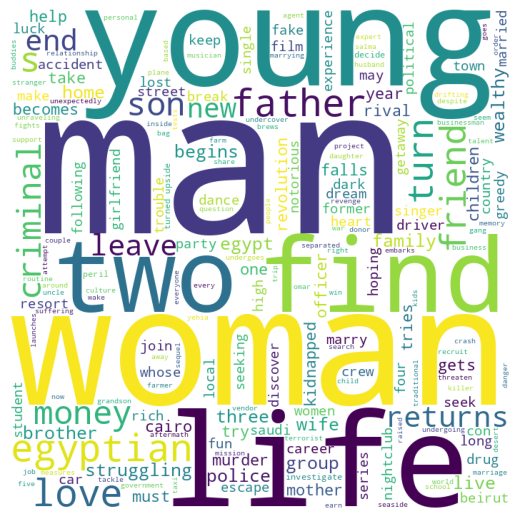

In [ ]:
# Wordcloud for cluster 6
kmeans_wordcloud(6)



*   Keywords observed in cluster 6: man,two,life,woman,life,young




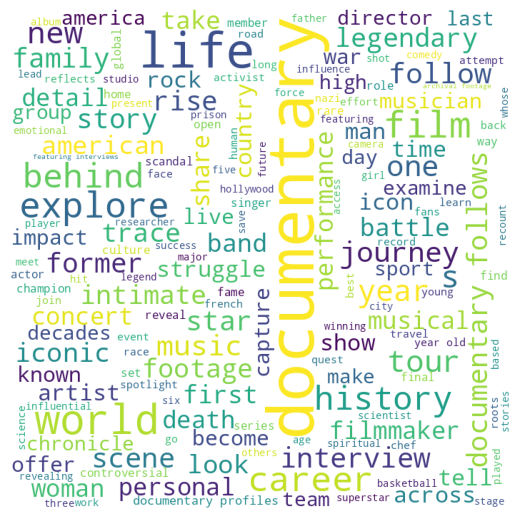

In [ ]:
# Wordcloud for cluster 7
kmeans_wordcloud(7)



*   Keywords observed in cluster 7: documentary, world, interview,explore, former




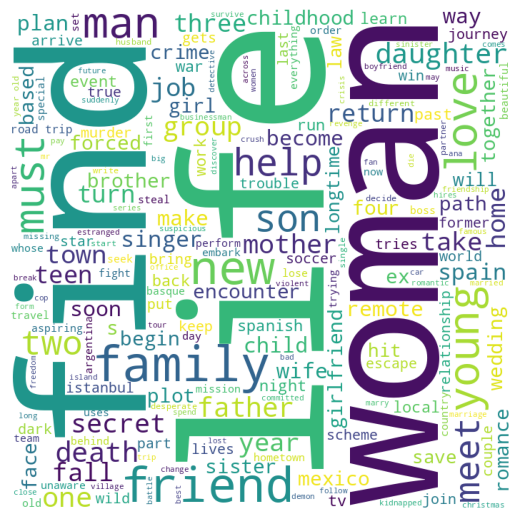

In [ ]:
# Wordcloud for cluster 8
kmeans_worldcloud(8)



*   Keywords observed in cluster 8: find, life, family, secret,meet




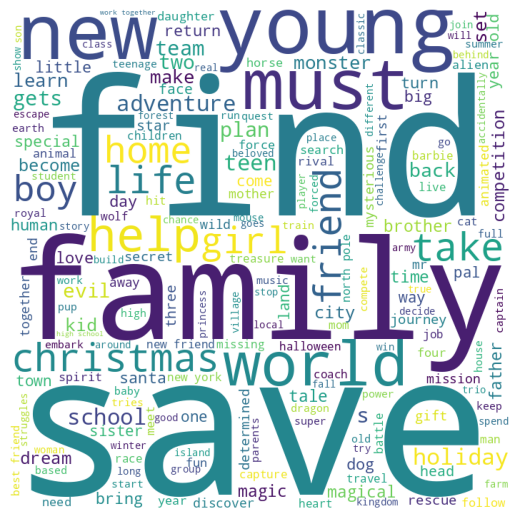

In [ ]:
# Wordcloud for cluster 9
kmeans_wordcloud(9)



*   Keywords observed in cluster 9: christmas, save, must, help,life,girl




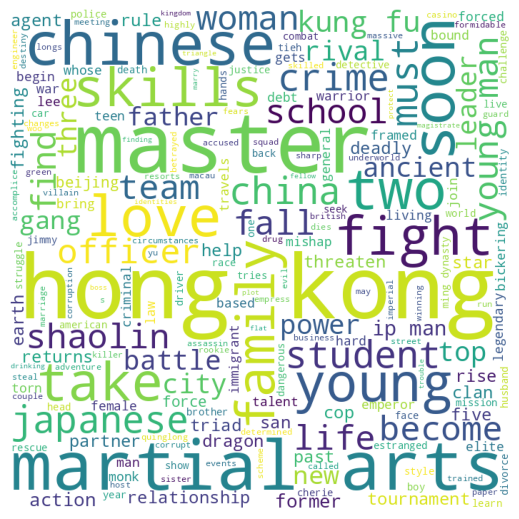

In [ ]:
# Wordcloud for cluster 10
kmeans_wordcloud(10)



*   Keywords observed in cluster 10: hong kong, martial, master, team, skills




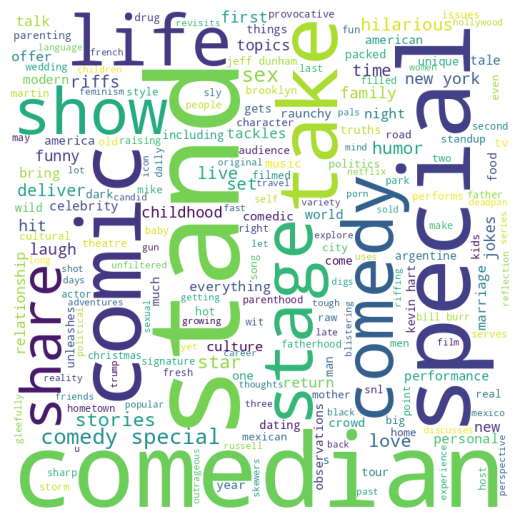

In [ ]:
# Wordcloud for cluster 11
kmeans_wordcloud(11)



*   Keywords observed in cluster 11: comedian, share, comic,special, share, show




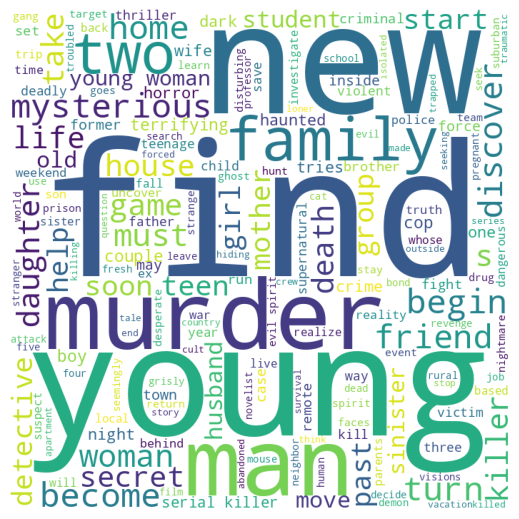

In [ ]:
# Wordcloud for cluster 12
kmeans_wordcloud(12)



*   Keywords observed in cluster 12: find, murder, young, family, man, detective, begin




**Hierarchical clustering:**

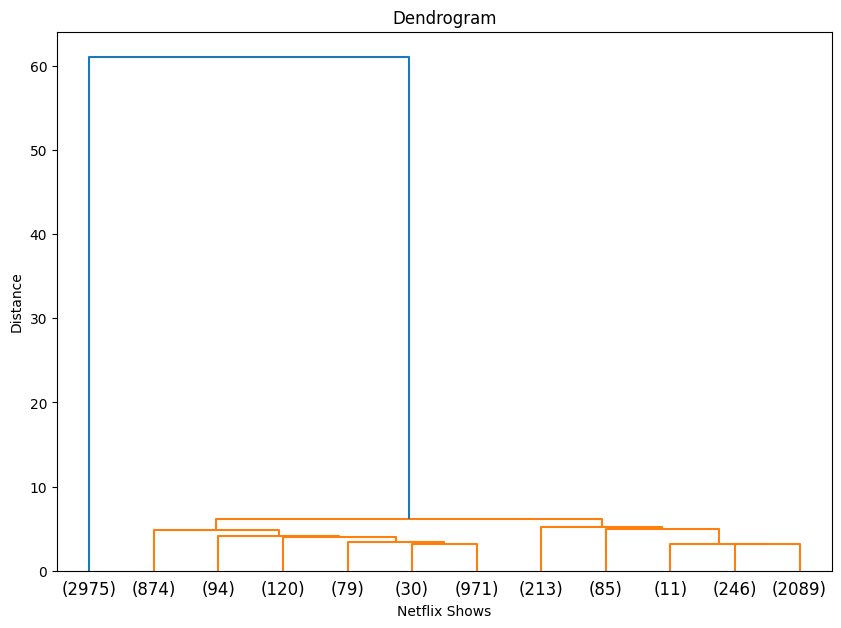

In [ ]:
plt.figure(figsize=(10, 7))
dend = shc.dendrogram(shc.linkage(x_pca, method='ward'), truncate_mode='lastp', p=12)
plt.title('Dendrogram')
plt.xlabel('Netflix Shows')
plt.ylabel('Distance')
plt.show()


In [ ]:
# Fitting hierarchical clustering model
hierarchical = AgglomerativeClustering(n_clusters=12, affinity='euclidean', linkage='ward')
hierarchical.fit_predict(x_pca)

array([7, 0, 3, ..., 7, 7, 7])

In [ ]:
# Adding a kmeans cluster number attribute
df1['hierarchical_cluster'] = hierarchical.labels_

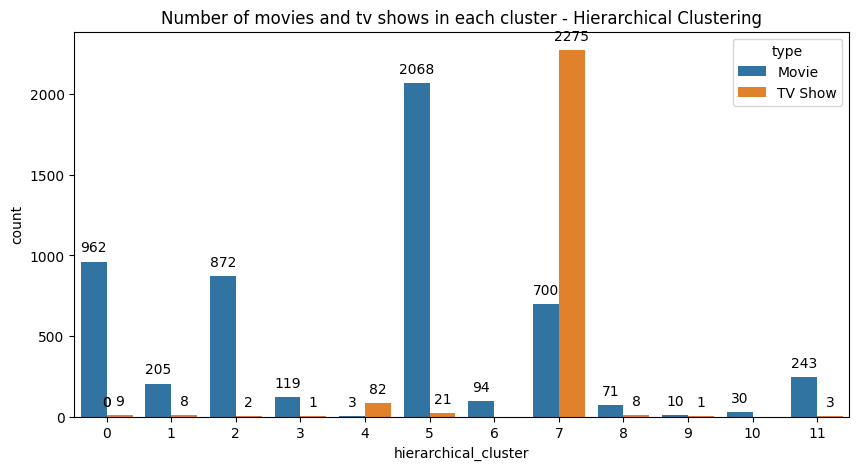

In [ ]:
# Number of movies and tv shows in each cluster
plt.figure(figsize=(10,5))
q = sns.countplot(x='hierarchical_cluster',data=df1, hue='type')
plt.title('Number of movies and tv shows in each cluster - Hierarchical Clustering')
for i in q.patches:
  q.annotate(format(i.get_height(), '.0f'), (i.get_x() + i.get_width() / 2., i.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

**Building wordclouds for different clusters built**

In [ ]:
# Building a wordcloud for the movie descriptions
def hierarchical_worldcloud(cluster_num):
  comment_words = ''
  stopwords = set(STOPWORDS)

  # iterate through the csv file
  for val in df1[df1['hierarchical_cluster']==cluster_num].description.values:

      # typecaste each val to string
      val = str(val)

      # split the value
      tokens = val.split()

      # Converts each token into lowercase
      for i in range(len(tokens)):
          tokens[i] = tokens[i].lower()

      comment_words += " ".join(tokens)+" "

  wordcloud = WordCloud(width = 700, height = 700,
                  background_color ='white',
                  stopwords = stopwords,
                  min_font_size = 10).generate(comment_words)


  # plot the WordCloud image
  plt.figure(figsize = (10,5), facecolor = None)
  plt.imshow(wordcloud)
  plt.axis("off")
  plt.tight_layout(pad = 0)

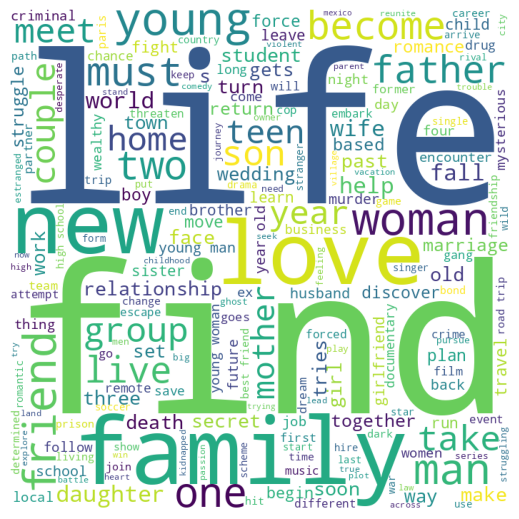

In [ ]:
# Wordcloud for cluster 0
hierarchical_worldcloud(0)



*   Keywords observed in cluster 0: life, new, find, family, save, friend, young, teen, adventure




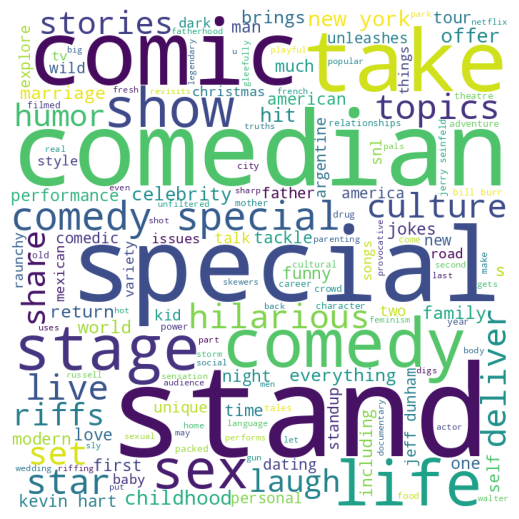

In [ ]:
# Wordcloud for cluster 1
hierarchical_worldcloud(1)



*   Keywords observed in cluster 1: love, family, life, student, romance, school, woman, master, father




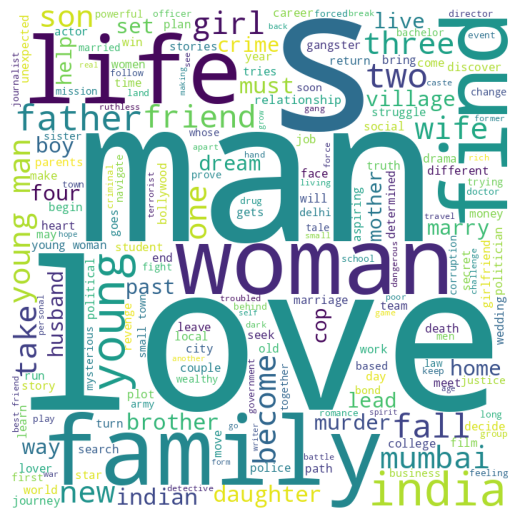

In [ ]:
# Wordcloud for cluster 2
hierarchical_worldcloud(2)



*   Keywords observed in cluster 2: life, new, series, crime, world, murder, history, detective




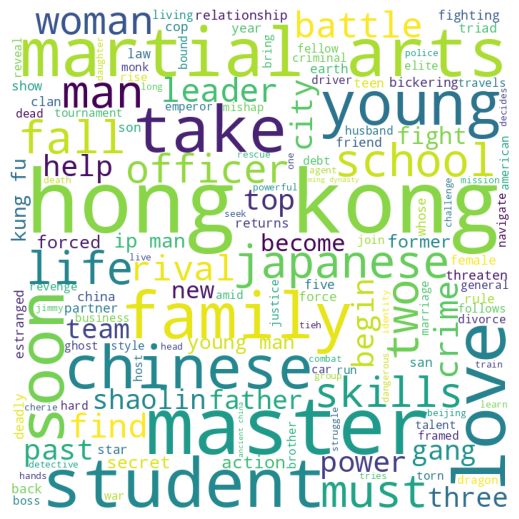

In [ ]:
# Wordcloud for cluster 3
hierarchical_worldcloud(3)



*   Keywords observed in cluster 3: family, life, love, friend, teen, woman, man, young, world, wedding, secret




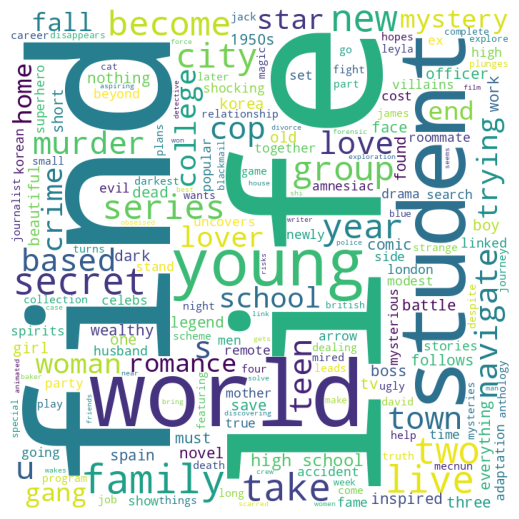

In [ ]:
# Wordcloud for cluster 4
hierarchical_worldcloud(4)



*   Keywords observed in cluster 4: documentary, music, world, team, interview,history, family, career, battle, death




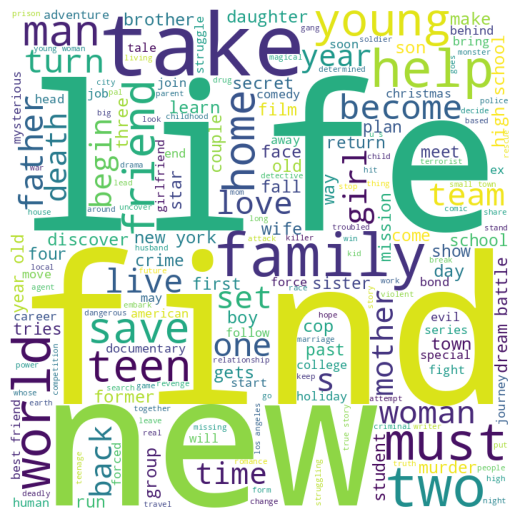

In [ ]:
# Wordcloud for cluster 5
hierarchical_worldcloud(5)



*   Keywords observed in cluster 5: family, life, mexico, young, new, woman, man, secret, spain, death, singer




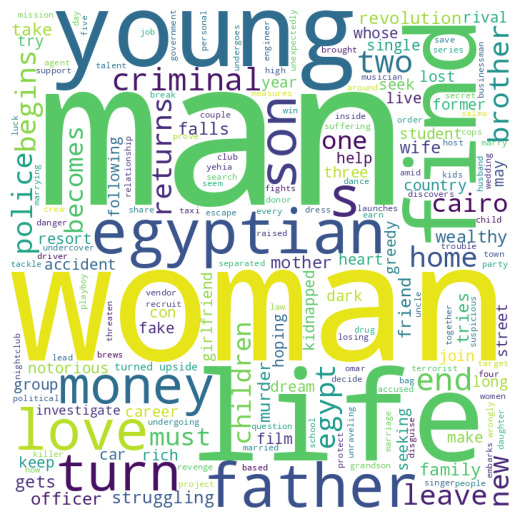

In [ ]:
# Wordcloud for cluster 6
hierarchical_worldcloud(6)



*   Keywords observed in cluster 6: young, life, girl, world, friend, mysterious, demon, student, school, father




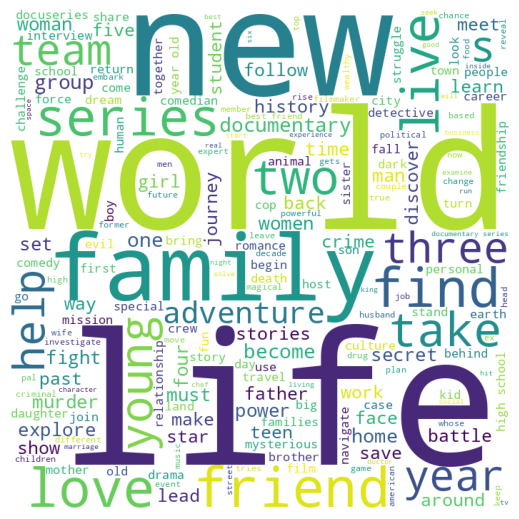

In [ ]:
# Wordcloud for cluster 7
hierarchical_worldcloud(7)



*   Keywords observed in cluster 7: love, life, woman, new, student, family, korea, secret, detective, young




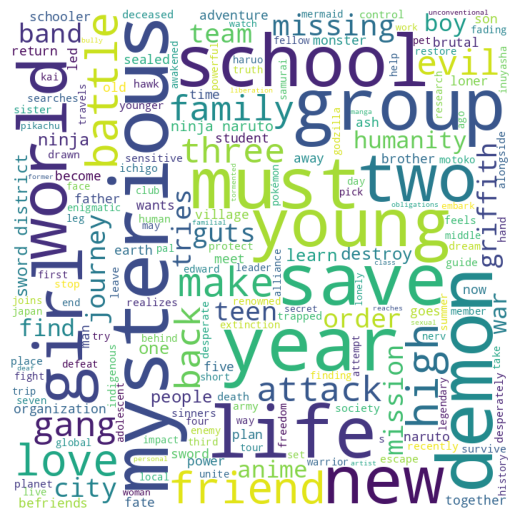

In [ ]:
# Wordcloud for cluster 8
hierarchical_worldcloud(8)



*   Keywords observed in cluster 8: woman, man life, egypt, wealthy, money, young, love, revolution, struggling




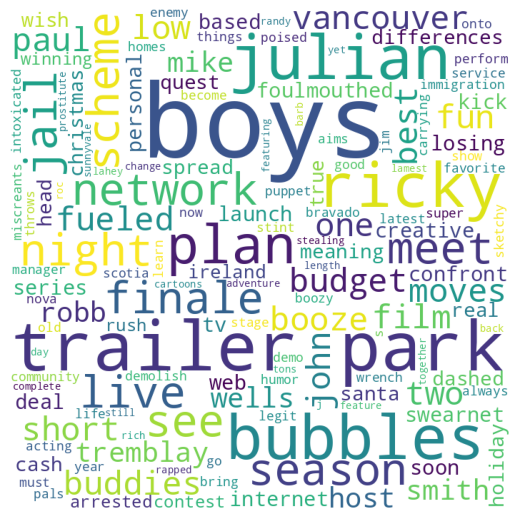

In [ ]:
# Wordcloud for cluster 9
hierarchical_worldcloud(9)



*   Keywords observed in cluster 9: comedian, stand, life, comic, special, show, live, star, stage, hilarious, stories




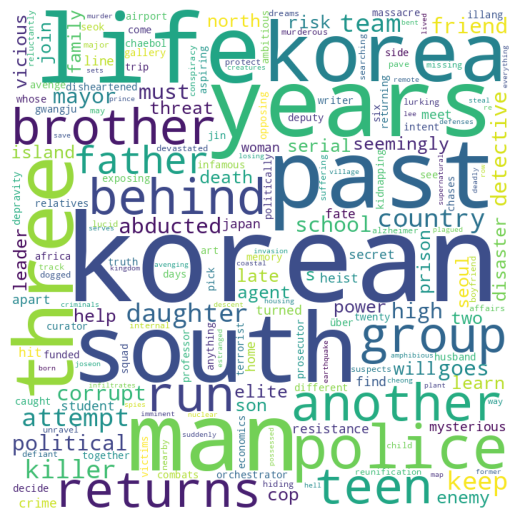

In [ ]:
# Wordcloud for cluster 10
hierarchical_worldcloud(10)



*   Keywords observed in cluster 10: animal, nature, explore, planet, species, survive, natural, life, examine, earth




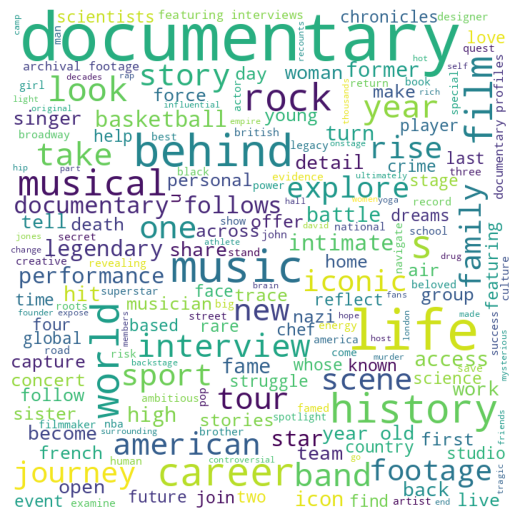

In [ ]:
# Wordcloud for cluster 11
hierarchical_worldcloud(11)



*   Keywords observed in cluster 11: love, man, woman, india, father, friend, girl, mumbai, city, learn, young




**Content based recommender system:**

In [ ]:
# defining a new df for building a recommender system
recommender_df = df1.copy()

In [ ]:
# Changing the index of the df from show id to show title
recommender_df['show_id'] = recommender_df.index

In [ ]:
# converting tokens to string
def convert(lst):
  return ' '.join(lst)

recommender_df['clustering_attributes'] = recommender_df['clustering_attributes'].apply(lambda x: convert(x))

In [ ]:
# setting title of movies/Tv shows as index
recommender_df.set_index('title',inplace=True)

In [ ]:
# Count vectorizer
CV = CountVectorizer()
converted_matrix = CV.fit_transform(recommender_df['clustering_attributes'])

In [ ]:
# Cosine similarity
cosine_similarity = cosine_similarity(converted_matrix)

In [ ]:
cosine_similarity.shape

(7787, 7787)

In [ ]:
# Developing a function to get 10 recommendations for a show
indices = pd.Series(recommender_df.index)

def recommend_10(title, cosine_sim = cosine_similarity):
  try:
    recommend_content = []
    idx = indices[indices == title].index[0]
    series = pd.Series(cosine_sim[idx]).sort_values(ascending = False)
    top10 = list(series.iloc[1:11].index)
    # list with the titles of the best 10 matching movies
    for i in top10:
      recommend_content.append(list(recommender_df.index)[i])
    print("If you liked '"+title+"', you may also enjoy:\n")
    return recommend_content

  except:
    return 'Invalid Entry'

In [ ]:
# Recommendations for 'A Single Man'
recommend_10('A Single Man')

If you liked 'A Man Called God', you may also enjoy:



['Million Pound Menu',
 'Midnight Diner',
 'Midnight Diner: Tokyo Stories',
 'Midnight Misadventures With Mallika Dua',
 'Mighty Express',
 'Mighty Little Bheem',
 'Mighty Little Bheem: Diwali',
 'Mighty Little Bheem: Festival of Colors',
 'Mighty Little Bheem: Kite Festival',
 'Mighty Morphin Alien Rangers']

In [ ]:
# Recommendations for 'Abstract: The Art of Design'
recommend_10('Abstract: The Art of Design')

If you liked 'A Man Called God', you may also enjoy:



['Million Pound Menu',
 'Midnight Diner',
 'Midnight Diner: Tokyo Stories',
 'Midnight Misadventures With Mallika Dua',
 'Mighty Express',
 'Mighty Little Bheem',
 'Mighty Little Bheem: Diwali',
 'Mighty Little Bheem: Festival of Colors',
 'Mighty Little Bheem: Kite Festival',
 'Mighty Morphin Alien Rangers']

In [ ]:
# Recommendations for 'Baahubali 2: The Conclusion (Malayalam Version)'
recommend_10('Baahubali 2: The Conclusion (Malayalam Version)')

If you liked 'A Man Called God', you may also enjoy:



['Million Pound Menu',
 'Midnight Diner',
 'Midnight Diner: Tokyo Stories',
 'Midnight Misadventures With Mallika Dua',
 'Mighty Express',
 'Mighty Little Bheem',
 'Mighty Little Bheem: Diwali',
 'Mighty Little Bheem: Festival of Colors',
 'Mighty Little Bheem: Kite Festival',
 'Mighty Morphin Alien Rangers']

In [ ]:
# Recommendations for 'XXXXX'
recommend_10('XXXXX')

'Invalid Entry'

**Conclusions:**




*   In this project, we wanted to group Netflix shows based on their similarities. We aimed to put similar shows together in clusters, so you can find shows you like more easily. Shows in the same cluster are alike, while those in different clusters are different from each other.

*   The dataset contained about 7787 records, and 11 attributes

*   We found out that Netflix has more movies than TV shows, and they keep adding more shows at a fast rate. Also, most of the shows on Netflix are made in the United States, and they're mostly for adults and young adults.

*   
We decided to categorize the data based on certain characteristics like director, cast, country, genre, and description. We converted these characteristics into numbers using a special tool called TFIDF vectorizer after preparing and organizing them.

*   Using TFIDF Vectorization, we generated a total of 20,000 attributes.

*   To handle the problem of having lots of features, we used Principal Component Analysis (PCA). We reduced the number of components to 4,000, which helped us keep most of the important information in the data, capturing over 80% of its variability.

*   At first, we grouped the data using the k-means clustering method. By looking at the elbow method and Silhouette score, we found that the best number of groups to use was 13.
*   After that, we made clusters using the Agglomerative clustering method. We looked at a special diagram called a dendrogram, which showed us that the best number of groups to use was 12.


*   We made a recommendation system based on the content of the shows you watch. We used something called a similarity matrix, which helps us figure out how similar different shows are to each other using cosine similarity. This system gives you 10 recommendations for shows similar to the ones you've watched.




